# I. Histogram of Oriented Gradients (HOG)

In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import cv2
import glob

In [2]:
global color_space, orient, pix_per_cell, cell_per_block 
global hog_channel, spatial_size, hist_bins, spatial_feat
global hist_feat, hot_feat

setting_color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
setting_orient = 9  # HOG orientations
setting_pix_per_cell = 8 # HOG pixels per cell
setting_cell_per_block = 2 # HOG cells per block
setting_hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
setting_spatial_size = (32, 32) # Spatial binning dimensions
setting_hist_bins = 32    # Number of histogram bins
setting_spatial_feat = True # Spatial features on or off
setting_hist_feat = True # Histogram features on or off
setting_hog_feat = True # HOG features on or off

8792  vehicle images loaded
8968  non-vehicle images loaded


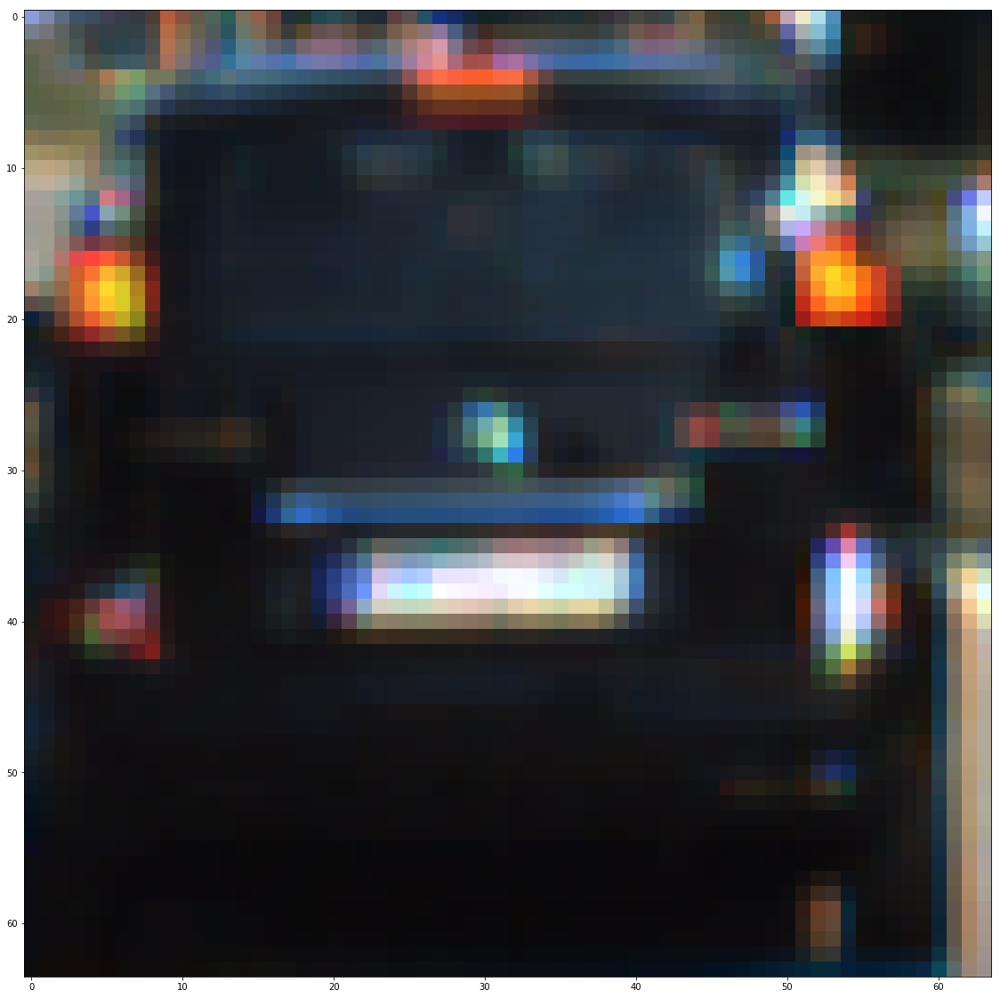

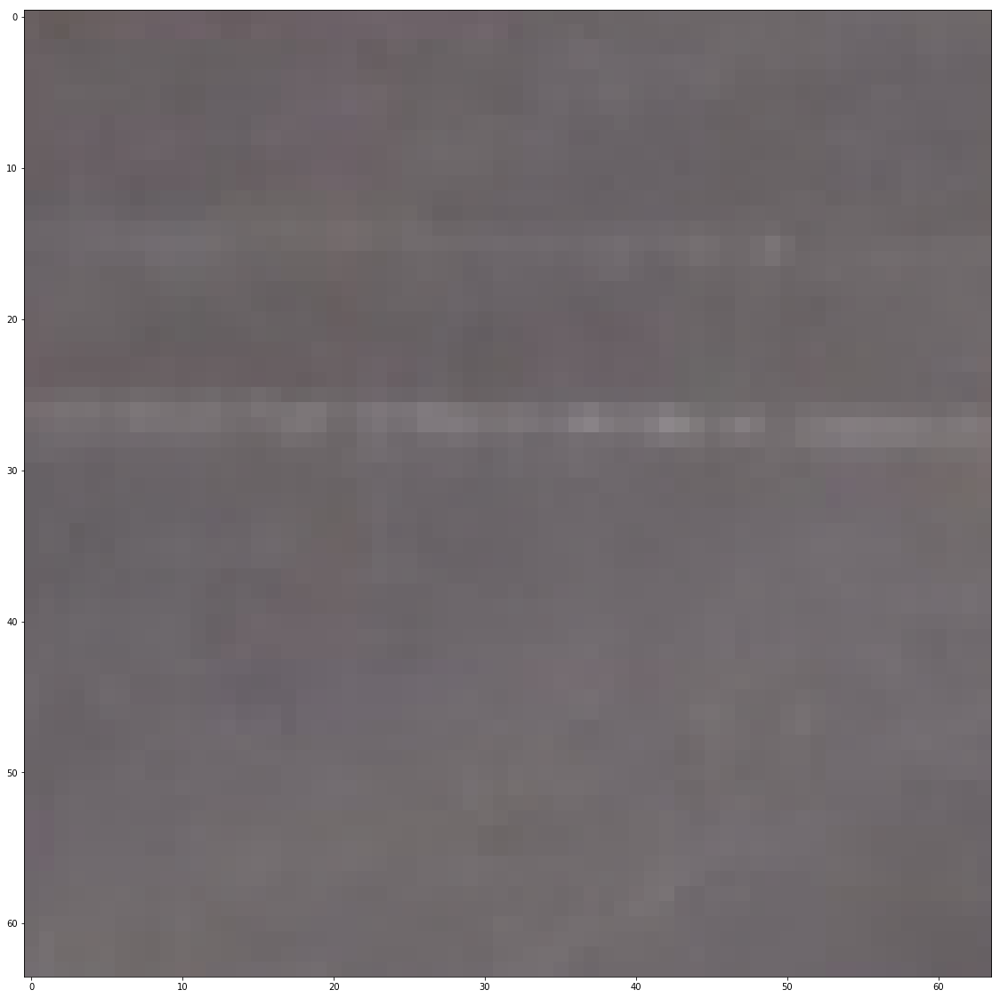

In [3]:
vehicle_samples = glob.glob('vehicles/*/*.png')
# vehicle_samples = vehicle_samples[:200]
print(len(vehicle_samples), " vehicle images loaded")
random_vehicle_selection = np.random.randint(0, len(vehicle_samples))
random_vehicle_image = mpimg.imread(vehicle_samples[random_vehicle_selection])

plt.figure(figsize=(20, 20))
plt.imshow(random_vehicle_image)

non_vehicle_samples = glob.glob('non-vehicles/*/*.png')
# non_vehicle_samples = non_vehicle_samples[:200]
print(len(non_vehicle_samples), " non-vehicle images loaded")
random_non_vehicle_selection = np.random.randint(0, len(non_vehicle_samples))
random_non_vehicle_image = mpimg.imread(non_vehicle_samples[random_non_vehicle_selection])

plt.figure(figsize=(20, 20))
plt.imshow(random_non_vehicle_image)

## 1. Extracting HOG Features

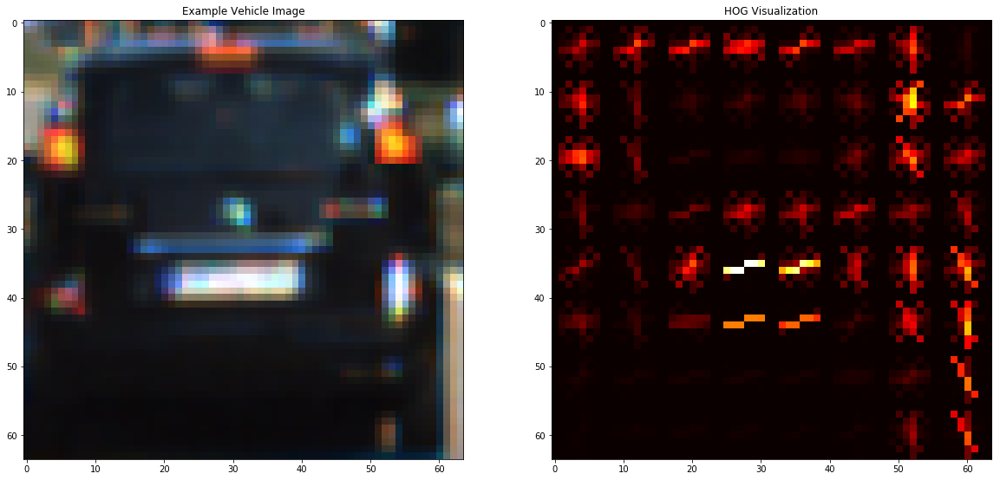

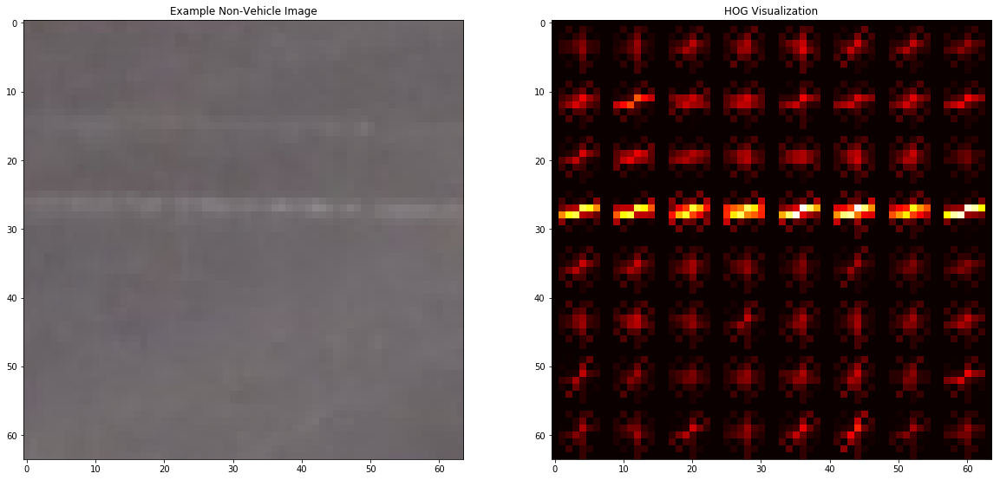

In [4]:
from skimage.feature import hog

def get_hog_features(img, orient, pix_per_cell, cell_per_block,
                     vis=False, feature_vec=True):
    if vis == True:
        features, hog_image = hog(
            img,
            orientations=orient,
            pixels_per_cell=(
              pix_per_cell,
              pix_per_cell
            ),
            cells_per_block=(
              cell_per_block,
              cell_per_block
            ),
            transform_sqrt=False, 
            visualise=vis,
            feature_vector=feature_vec,
        )
        return features, hog_image
    else:      
        features = hog(
            img,
            orientations=orient,
            pixels_per_cell=(
                pix_per_cell,
                pix_per_cell
            ),
            cells_per_block=(
                cell_per_block,
                cell_per_block
            ),
            transform_sqrt=False,
            visualise=vis,
            feature_vector=feature_vec,
        )
        return features



vehicle_gray = cv2.cvtColor(random_vehicle_image, cv2.COLOR_RGB2GRAY)

features, hog_image = get_hog_features(
    vehicle_gray,
    setting_orient,
    setting_pix_per_cell,
    setting_cell_per_block,
    vis=True,
    feature_vec=False
)

fig = plt.figure(figsize=(20, 20))
plt.subplot(121)
plt.imshow(random_vehicle_image)
plt.title('Example Vehicle Image')
plt.subplot(122)
plt.imshow(hog_image, cmap='hot')
plt.title('HOG Visualization')


non_vehicle_gray = cv2.cvtColor(random_non_vehicle_image, cv2.COLOR_RGB2GRAY)

features, hog_image = get_hog_features(
    non_vehicle_gray,
    setting_orient,
    setting_pix_per_cell,
    setting_cell_per_block,
    vis=True,
    feature_vec=False
)

fig = plt.figure(figsize=(20, 20))
plt.subplot(121)
plt.imshow(random_non_vehicle_image)
plt.title('Example Non-Vehicle Image')
plt.subplot(122)
plt.imshow(hog_image, cmap='hot')
plt.title('HOG Visualization')


## 2. Extracting Spatial and Color Histograms

In [5]:
# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    color1 = cv2.resize(img[:, :, 0], size).ravel()
    color2 = cv2.resize(img[:, :, 1], size).ravel()
    color3 = cv2.resize(img[:, :, 2], size).ravel()
    # Return the feature vector
    return np.hstack((color1, color2, color3))

# Define a function to compute color histogram features  
def color_hist(img, nbins=32):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate(
        (
            channel1_hist[0],
            channel2_hist[0],
            channel3_hist[0]
        )
    )
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

## 3. Combining Features

In [6]:
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == "YCrCb":
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image) 
        
        if spatial_feat:
            # Apply bin_spatial() to get spatial color features
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat:
            # Apply color_hist() also with a color space option now
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat:
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(
                        get_hog_features(
                            feature_image[:, :, channel],
                            orient,
                            pix_per_cell,
                            cell_per_block,
                            vis=False,
                            feature_vec=True
                        )
                    )
                hog_features = np.ravel(hog_features)
            else:
                hog_features = get_hog_features(feature_image[:, :, hog_channel],
                                               orient, pix_per_cell, cell_per_block,
                                               vis=False, feature_vec=True)
            file_features.append(hog_features)
        # Append the new feature vector to the features list
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

## 4. Training an SVM

In [7]:
from sklearn import svm, grid_search, preprocessing, cross_validation
import time

/Users/matthewhardwick/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/Users/matthewhardwick/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/sklearn/grid_search.py:43: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


In [29]:
t=time.time()

# Reduce sample size to reduce runtime
num_samples = 1000
random_indexes = np.random.randint(0, len(vehicle_samples), num_samples)
test_vehicles = vehicle_samples
# test_vehicles = np.array(vehicle_samples)[random_indexes]
test_non_vehicles = non_vehicle_samples
# test_non_vehicles = np.array(non_vehicle_samples)[random_indexes]

# Extract features on this set

features_vehicle = extract_features(
    test_vehicles,
    color_space=setting_color_space,
    spatial_size=setting_spatial_size,
    hist_bins=setting_hist_bins,
    orient=setting_orient,
    pix_per_cell=setting_pix_per_cell,
    cell_per_block=setting_cell_per_block,
    hog_channel=setting_hog_channel,
    spatial_feat=setting_spatial_feat,
    hist_feat=setting_hist_feat,
    hog_feat=setting_hog_feat,
)
features_non_vehicle = extract_features(
    test_non_vehicles,
    color_space=setting_color_space,
    spatial_size=setting_spatial_size,
    hist_bins=setting_hist_bins,
    orient=setting_orient,
    pix_per_cell=setting_pix_per_cell,
    cell_per_block=setting_cell_per_block,
    hog_channel=setting_hog_channel,
    spatial_feat=setting_spatial_feat,
    hist_feat=setting_hist_feat,
    hog_feat=setting_hog_feat,
)

print(time.time() - t, " seconds to compute features...")
t = time.time()

global setting_X_scaler

# Create the combined and scaled vehicle/non-vehicle features set
X = np.vstack((features_vehicle, features_non_vehicle)).astype(np.float64)
print(X.shape)
setting_X_scaler = preprocessing.StandardScaler().fit(X)
scaled_X = setting_X_scaler.transform(X)

# Label set
y = np.hstack(
    (
        np.ones(len(features_vehicle)),
        np.zeros(len(features_non_vehicle)),
    ),
)

# Do a training/test split
# Split up data into randomized training and test sets


91.30087494850159  seconds to compute features...
(17760, 8460)


In [9]:
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = cross_validation.train_test_split(
    scaled_X, y, test_size=0.1, random_state=rand_state)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to massage data...')

8.84 Seconds to massage data...


In [10]:
print("Using...")
print(setting_orient, " orientations.")
print(setting_pix_per_cell, " pixels per cell.")
print(setting_cell_per_block, " cells per block.")
print(setting_hist_bins, " histogram bins.")
print(setting_spatial_size, " spatial sampling.")

print("Feature vector length: ", len(X_train[0]))

Using...
9  orientations.
8  pixels per cell.
2  cells per block.
32  histogram bins.
(32, 32)  spatial sampling.
Feature vector length:  8460


In [11]:
svc = svm.LinearSVC()

# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')


# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('\n\nMy SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

11.68 Seconds to train SVC...
Test Accuracy of SVC =  0.9927


My SVC predicts:  [ 1.  1.  0.  0.  0.  0.  0.  1.  0.  0.]
For these 10 labels:  [ 1.  1.  0.  0.  0.  0.  0.  1.  0.  0.]
0.00345 Seconds to predict 10 labels with SVC


# II. Sliding Window Search

## 1. Sliding Window Search Implementation

In [12]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_windows = np.int(xspan/nx_pix_per_step) - 1
    ny_windows = np.int(yspan/ny_pix_per_step) - 1 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coords
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the drawn copy
    return imcopy

## 2. Searching the Windows in the image

In [13]:
def single_image_features(image, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9,
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True,
                        vis=False):
    image_features = []
    
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        elif color_space == "YCrCb":
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(image) 
        
    if spatial_feat:
        # Apply bin_spatial() to get spatial color features
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        image_features.append(spatial_features)
    if hist_feat:
        # Apply color_hist() also with a color space option now
        hist_features = color_hist(feature_image, nbins=hist_bins)
        image_features.append(hist_features)
    if hog_feat:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(
                    get_hog_features(
                        feature_image[:, :, channel],
                        orient,
                        pix_per_cell,
                        cell_per_block,
                        vis=False,
                        feature_vec=True
                    )
                )
            hog_features = np.ravel(hog_features)
        else:
            if vis:
                hog_features, hog_image = get_hog_features(feature_image[:, :, hog_channel],
                                           orient, pix_per_cell, cell_per_block,
                                           vis=True, feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:, :, hog_channel],
                                           orient, pix_per_cell, cell_per_block,
                                           vis=False, feature_vec=True)
        image_features.append(hog_features)
        
    if vis:
        return np.concatenate(image_features), hog_image
    else:
        return np.concatenate(image_features)


def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):
    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(
            img[
                window[0][1]:window[1][1],
                window[0][0]:window[1][0]
            ],
            (64, 64)
        )      
        #4) Extract features for that window using single_img_features()
        features = single_image_features(
            test_img,
            color_space=color_space,
            spatial_size=spatial_size,
            hist_bins=hist_bins,
            orient=orient,
            pix_per_cell=pix_per_cell,
            cell_per_block=cell_per_block,
            hog_channel=hog_channel,
            spatial_feat=spatial_feat,
            hist_feat=hist_feat,
            hog_feat=hog_feat,
            vis=False,
        )
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

def visualize(fig, rows, cols, images, titles):
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i+1)
        plt.title(i+1)
        image_dims = len(image.shape)
        if image_dims < 3:
            plt.imshow(image, cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(image)
            plt.title(titles[i])

## 3. Test on an Example Image

0.0 1.0
3.247648000717163 seconds to process one image searching 849 windows
0.0 1.0
3.140268087387085 seconds to process one image searching 849 windows
0.0 1.0
3.2733099460601807 seconds to process one image searching 849 windows
0.0 1.0
3.1182479858398438 seconds to process one image searching 849 windows
0.0 1.0
3.157522201538086 seconds to process one image searching 849 windows
0.0 1.0
3.1045100688934326 seconds to process one image searching 849 windows


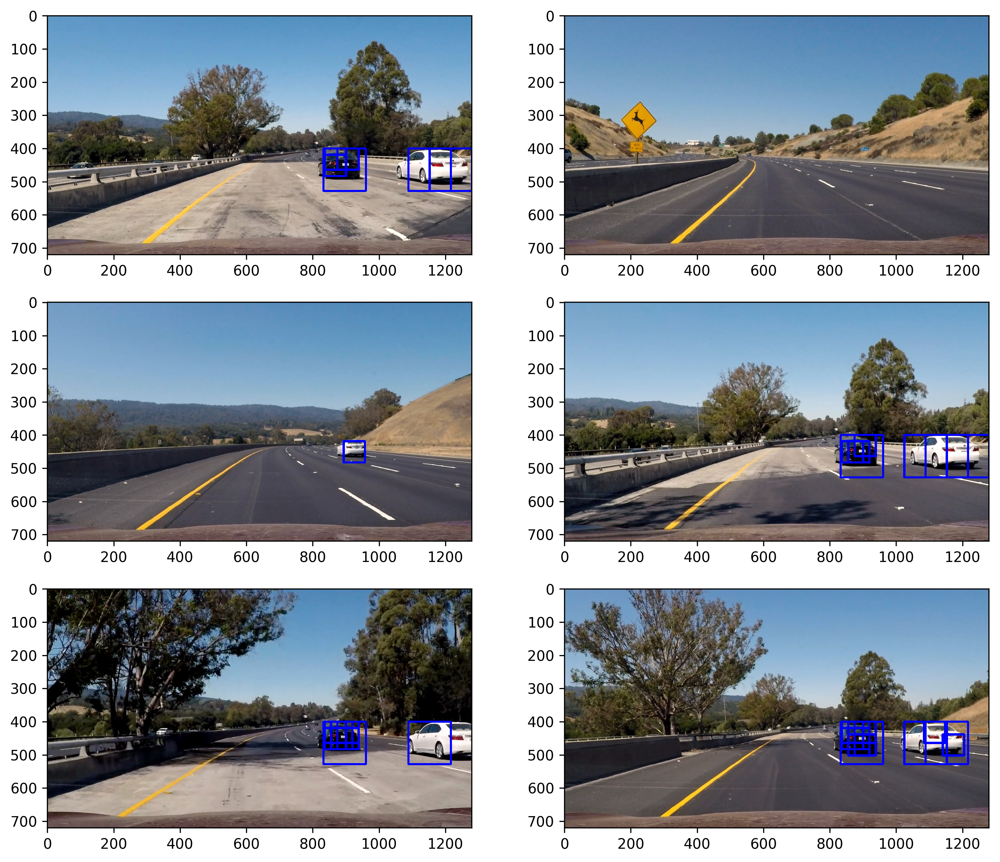

In [14]:
example_images = glob.glob('test_images/*.jpg')
images = []
titles = []

y_start_stop = [400, 656] # Min and max in y to search in slide_window()
overlap = 0.5

for image_path in example_images:
    t1 = time.time()
    image = mpimg.imread(image_path)
    draw_image = np.copy(image)
    image = image.astype(np.float32)/255
    print(np.min(image), np.max(image))

    windows = slide_window(
        image,
        x_start_stop=[None, None],
        y_start_stop=y_start_stop,
        xy_window=(64, 64),
        xy_overlap=(0.7, 0.7)
    )
    windows += slide_window(
        image,
        x_start_stop=[None, None],
        y_start_stop=y_start_stop,
        xy_window=(128, 128),
        xy_overlap=(overlap, overlap)
    )
    
    hot_windows = search_windows(
        image,
        windows,
        svc,
        setting_X_scaler,
        color_space=setting_color_space, 
        spatial_size=setting_spatial_size,
        hist_bins=setting_hist_bins, 
        orient=setting_orient,
        pix_per_cell=setting_pix_per_cell, 
        cell_per_block=setting_cell_per_block, 
        hog_channel=setting_hog_channel,
        spatial_feat=setting_spatial_feat, 
        hist_feat=setting_hist_feat,
        hog_feat=setting_hog_feat,
    )                       

    window_image = draw_boxes(
        draw_image,
        hot_windows,
        color=(0, 0, 255),
        thick=6
    )
    images.append(window_image)
    titles.append('')
    print(time.time()-t1, 'seconds to process one image searching', len(windows), 'windows')

fig = plt.figure(figsize=(12, 18), dpi=300)
visualize(fig, 5, 2, images, titles)

In [15]:
def convert_color(image, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(image, cv2.COLOR_RGB2LUV)

In [34]:
def scaled_window_search(image, ystart, ystop, window_size, cells_per_step, scale, svc):
    image_boxes = []
    heatmap = np.zeros_like(image[:, :, 0])
    image = image.astype(np.float32)/255
    image_to_search = image[ystart:ystop, :, :]
    color_trans_to_search = convert_color(image_to_search, conv='RGB2YCrCb')
    if scale != 1:
        imshape = color_trans_to_search.shape
        color_trans_to_search = cv2.resize(
            color_trans_to_search,
            (
                np.int(imshape[1]/scale),
                np.int(imshape[0]/scale),
            ),
        )
    channel1 = color_trans_to_search[:, :, 0]
    channel2 = color_trans_to_search[:, :, 1]
    channel3 = color_trans_to_search[:, :, 2]
    
    num_x_blocks = (channel1.shape[1] // setting_pix_per_cell) - 1
    num_y_blocks = (channel1.shape[0] // setting_pix_per_cell) - 1
    num_features_per_block = setting_orient*setting_cell_per_block**2
    window = window_size
    num_blocks_per_window = (window // setting_pix_per_cell) - 1
    num_x_steps = (num_x_blocks - num_blocks_per_window) // cells_per_step
    num_y_steps = (num_y_blocks - num_blocks_per_window) // cells_per_step
    
    # Get HOG features for the entire search image
    hog1 = get_hog_features(
        channel1,
        setting_orient,
        setting_pix_per_cell,
        setting_cell_per_block,
        feature_vec=False,
    )
    hog2 = get_hog_features(
        channel2,
        setting_orient,
        setting_pix_per_cell,
        setting_cell_per_block,
        feature_vec=False,
    )
    hog3 = get_hog_features(
        channel3,
        setting_orient,
        setting_pix_per_cell,
        setting_cell_per_block,
        feature_vec=False,
    )
    
    for xb in range(num_x_steps):
        for yb in range(num_y_steps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            hog_features1 = hog1[
                ypos:ypos+num_blocks_per_window,
                xpos:xpos+num_blocks_per_window,
            ].ravel()
            hog_features2 = hog2[
                ypos:ypos+num_blocks_per_window,
                xpos:xpos+num_blocks_per_window,
            ].ravel()
            hog_features3 = hog3[
                ypos:ypos+num_blocks_per_window,
                xpos:xpos+num_blocks_per_window,
            ].ravel()

            hog_features = np.hstack((
                hog_features1,
                hog_features2,
                hog_features3,
            ))
            
            x_left = xpos * setting_pix_per_cell
            y_top = ypos * setting_pix_per_cell
            
            # Get the image patch
            sub_image = cv2.resize(
                color_trans_to_search[
                    y_top:y_top+window,
                    x_left:x_left+window,
                ],
                (96, 96),
            )
            
            # Color features
            spatial_features = bin_spatial(
                sub_image,
                size=setting_spatial_size
            )
            hist_features = color_hist(
                sub_image,
                nbins=setting_hist_bins,
            )
            
            # Scale features and predict
            test_features = setting_X_scaler.transform(
                np.hstack((
                    spatial_features,
                    hist_features,
                    hog_features,
                )).reshape(1, -1),
            )
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                x_box_left = np.int(x_left * scale)
                y_box_top = np.int(y_top * scale)
                window_draw = np.int(window * scale)
                
                image_boxes.append((
                    (x_box_left, y_box_top + ystart),
                    (x_box_left + window_draw, y_box_top + window_draw + ystart),
                ))
                heatmap[
                    y_box_top + ystart:y_box_top + window_draw + ystart,
                    x_box_left:x_box_left + window_draw
                ] += 1

    return image_boxes, heatmap

16
0.7778079509735107 seconds to run
1
0.7878201007843018 seconds to run
2
0.7034058570861816 seconds to run
21
0.7282030582427979 seconds to run
8
0.7508008480072021 seconds to run
22
0.752906084060669 seconds to run


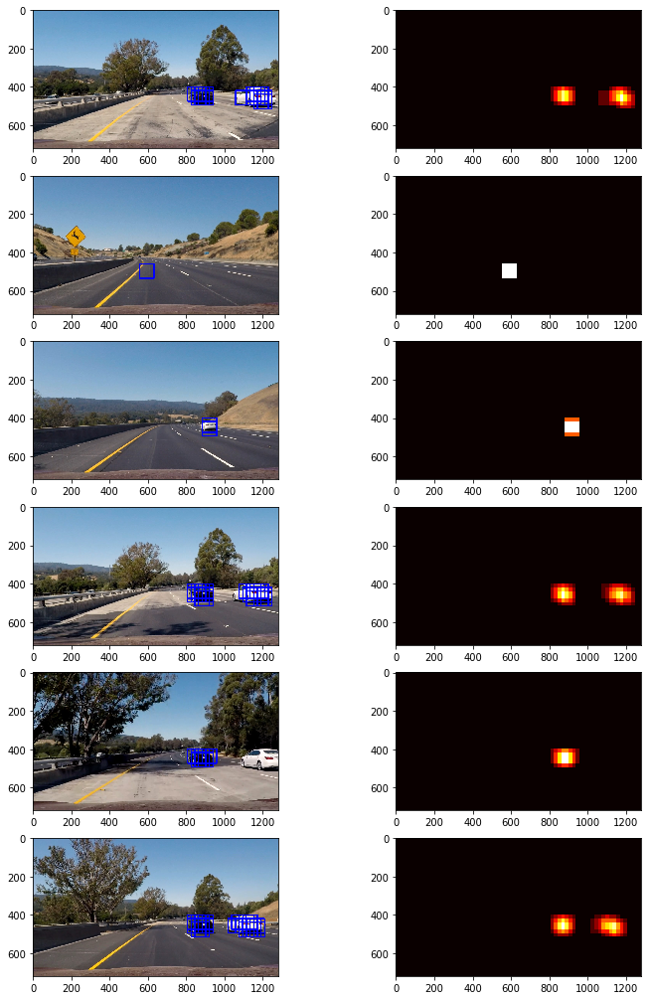

In [35]:
out_images = []
out_maps = []
out_titles = []
out_boxes = []
# Limit in the y dimension
ystart = 400
ystop = 656
scale = 1.2

for image_path in example_images:
    t = time.time()
    image = mpimg.imread(image_path)
    draw_image = np.copy(image)
    
    boxes, heatmap = scaled_window_search(image, ystart, ystop, 64, 2, scale, svc)

    print(len(boxes))
    
    window_image = draw_boxes(
        draw_image,
        boxes,
        color=(0, 0, 255),
        thick=6
    )
    
    print(time.time() - t, 'seconds to run')
    
    out_images.append(window_image)
    out_titles.append('')
    out_images.append(heatmap)
    out_titles.append('')
    
    
fig = plt.figure(figsize=(12, 24))
visualize(fig, 8, 2, out_images, out_titles)
        
    

In [36]:
from scipy.ndimage.measurements import label

def apply_threshold(heatmap, threshold):
    # Zero everything below threshold
    heatmap[heatmap <= threshold] = 0
    
    return heatmap

def draw_labeled_boxes(unlabeled_image, labels):
#     print(labels[1], "cars found")
    for car_index in range(1, labels[1]+1):
#         print(car_index)
        # Find pixels with each car index label value
        nonzero = (labels[0] == car_index).nonzero()
        
        # Identify x and y for pixels
        nonzero_x = np.array(nonzero[0])
        nonzero_y = np.array(nonzero[1])
        
        # Define the bounding box from min/max x and y
        bbox = (
            (
                np.min(nonzero_y),
                np.min(nonzero_x)
            ),
            (
                np.max(nonzero_y),
                np.max(nonzero_x)
            ),
        )
#         print(bbox)
        
        # Draw the box
        cv2.rectangle(unlabeled_image, bbox[0], bbox[1], (0, 0, 255), 6)
    return unlabeled_image

0.9443960189819336 seconds to run
0.9043300151824951 seconds to run
0.9734358787536621 seconds to run
0.830009937286377 seconds to run
0.8423929214477539 seconds to run
0.803480863571167 seconds to run


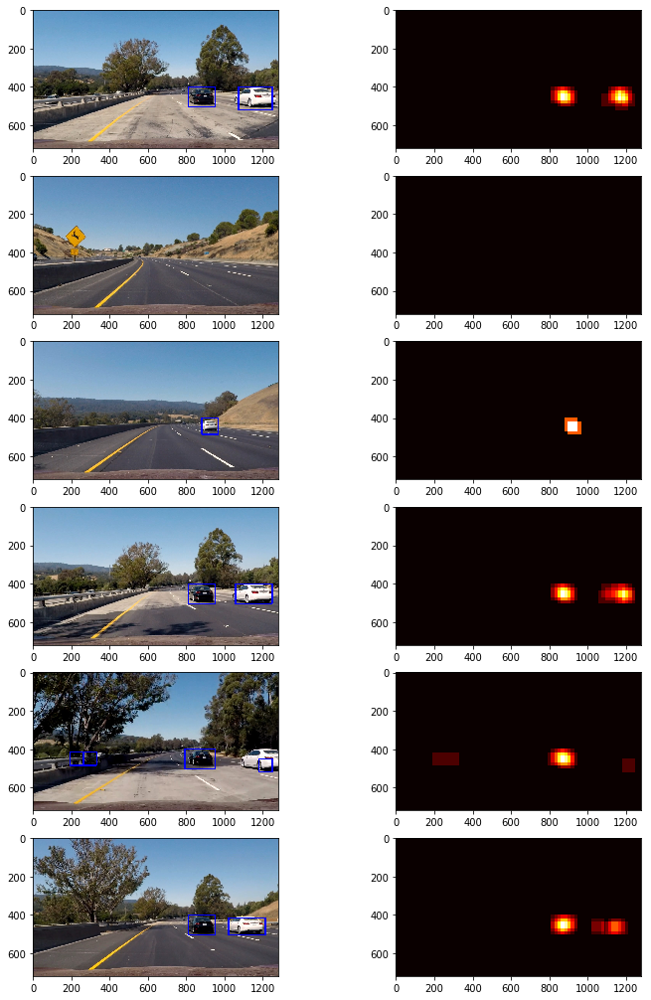

In [39]:
new_out_images = []
new_out_titles = []
# Limit in the y dimension
ystart = 400
ystop = 656
scale = 1.1

for image_path in example_images:
    t = time.time()
    image = plt.imread(image_path)
    draw_image = np.copy(image)

    boxes, heatmap = scaled_window_search(image, ystart, ystop, 64, 2, scale, svc)

    labels = label(heatmap)

    window_image = draw_labeled_boxes(draw_image, labels)

    #     window_image = draw_boxes(
    #         draw_image,
    #         boxes,
    #         color=(0, 0, 255),
    #         thick=6
    #     )

    print(time.time() - t, 'seconds to run')



    new_out_images.append(window_image)
    new_out_titles.append('')
    new_out_images.append(heatmap)
    new_out_titles.append('')
    
fig = plt.figure(figsize=(12, 24))
visualize(fig, 8, 2, new_out_images, new_out_titles)

# III. Video Pipeline

## 1. Make the Frame Processor

In [40]:
# Define a class to receive the characteristics of each vehicle detection
# Objects defined as vehicles will be where we get multiple overlaps over time.
class Vehicle():
    def __init__(self):
        self.detected = False
        self.n_detections = 0
        self.recent_bboxes = []
    
    def update_position(self, label_map, car_index):
        self.n_detections += 1
        nonzero = (label_map == car_index).nonzero()
        # Identify x and y for pixels
        nonzero_x = np.array(nonzero[0])
        nonzero_y = np.array(nonzero[1])
        
        if len(self.recent_bboxes) > 3:
            self.recent_bboxes.pop()
        
        # Define the bounding box from min/max x and y
        self.recent_bboxes.insert(0,
            (
                (
                    np.min(nonzero_y),
                    np.min(nonzero_x)
                ),
                (
                    np.max(nonzero_y),
                    np.max(nonzero_x)
                ),
            )
        )
    
    @property
    def current_position(self):
        number_of_bboxes = len(self.recent_bboxes)
        ymin_avg = xmin_avg = ymax_avg = xmax_avg = 0
        for bbox in self.recent_bboxes:
            ymin_avg += bbox[0][0]
            xmin_avg += bbox[0][1]
            ymax_avg += bbox[1][0]
            xmax_avg += bbox[1][1]
        ymin_avg = ymin_avg // number_of_bboxes
        xmin_avg = xmin_avg // number_of_bboxes
        ymax_avg = ymax_avg // number_of_bboxes
        xmax_avg = xmax_avg // number_of_bboxes
        return (
            (ymin_avg, xmin_avg),
            (ymax_avg, xmax_avg),
        )

In [47]:
carlist = []

ystart = 400
ystop = 656
scale = 1.1
    
def process_image(image):
    boxes, heatmap = scaled_window_search(image, ystart, ystop, 64, 2, scale, svc)
    heatmap = apply_threshold(heatmap, 2)
    labels = label(heatmap)
    
#     for car_index in range(1, labels[1]+1):
#         if car_index >= len(carlist):
#             carlist.append(
#                 Vehicle()
#             )
#         current_vehicle = carlist[car_index - 1]
#         current_vehicle.update_position(labels[0], car_index - 1)
    
#     draw_image = draw_boxes(np.copy(image), [current_vehicle.current_position])
    
    draw_image = draw_labeled_boxes(np.copy(image), labels)
    return draw_image

## 2. Video Processor

In [48]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

output = 'project_output.mp4'
clip = VideoFileClip('project_video.mp4')
# clip = VideoFileClip('test_video.mp4')
test_clip = clip.fl_image(process_image)
%time
test_clip.write_videofile(output, audio=False)

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 5.96 µs
[MoviePy] >>>> Building video project_output.mp4
[MoviePy] Writing video project_output.mp4


100%|█████████▉| 1260/1261 [22:03<00:00,  1.08it/s] 


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_output.mp4 



In [49]:
HTML("""
<video width="960" height="540" controls>
    <source src="{0}">
</video>
""".format(output))